# Bike sharing demand prediction

## Summary

This project aimed to predict the hourly demand for bike rentals in the Seoul Bike Sharing System using machine learning models. Accurately forecasting bike rental demand is crucial for maintaining a stable supply and ensuring the availability of bikes for users when needed. This is beneficial for bike-sharing operators to optimize the bike fleet management and improve user experience.

The problem is a regression task, where the goal is to predict the number of bikes rented per hour based on various weather and time series features. Data preparation has been performed, such as Exploratory Data Analysis (EDA), data cleaning, and feature engineering. Multiple models have been experimented with and fine-tuned, such as linear regression, random forest, XGBoost, and Prophet. The performance of the models is compared using Root Mean Square Error (RMSE) and R-square (R2). 

## Load dataset

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
bike_df = pd.read_csv('./SeoulBikeData.csv')

In [3]:
bike_df.head()

,Date,Rented Bike Count,Hour,Temperature,Humidity,Wind Speed,Visibility,Dew Point Temperature,Solar Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning Day
0,1/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,1/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,1/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,1/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,1/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [4]:
bike_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Date                   8760 non-null   object 
 1   Rented Bike Count      8760 non-null   int64  
 2   Hour                   8760 non-null   int64  
 3   Temperature            8760 non-null   float64
 4   Humidity               8760 non-null   int64  
 5   Wind Speed             8760 non-null   float64
 6   Visibility             8760 non-null   int64  
 7   Dew Point Temperature  8760 non-null   float64
 8   Solar Radiation        8760 non-null   float64
 9   Rainfall               8760 non-null   float64
 10  Snowfall               8760 non-null   float64
 11  Seasons                8760 non-null   object 
 12  Holiday                8760 non-null   object 
 13  Functioning Day        8760 non-null   object 
dtypes: float64(6), int64(4), object(4)
memory usage: 958.2+ 

In [5]:
# Convert the Date format first before EDA
bike_df['Date'] = pd.to_datetime(bike_df['Date'], format='%d/%m/%Y')
bike_df = bike_df.sort_values(by=['Date', 'Hour'], ascending=[True, True]).reset_index(drop=True)
bike_df.head()

,Date,Rented Bike Count,Hour,Temperature,Humidity,Wind Speed,Visibility,Dew Point Temperature,Solar Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning Day
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,2017-12-01,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,2017-12-01,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


## Split X (features) & Y (target) into train & test dataset
To prevent data leakage, the dataset is split into X and Y first before doing EDA and feature engineering.

The train and test dataset are created using a 9:1 split. Note that due to the temporal nature, the data is not shuffled before splitting.

Right now the whole dataframe is treated as X to preserve columns for feature engineering purposes. A function will be created to transform the features in the test set.

In [6]:
from sklearn.model_selection import train_test_split

y = bike_df['Rented Bike Count']
X_train, X_test, y_train, y_test = train_test_split(bike_df, y, test_size=0.1, shuffle=False)

print('Shapes of X_train, y_train, X_test, y_test: ', X_train.shape, y_train.shape, X_test.shape, y_test.shape)

Shapes of X_train, y_train, X_test, y_test:  (7884, 14) (7884,) (876, 14) (876,)


## EDA
This step first performs EDA to understand the predictors (x) and the response (y). The response is the Rented Bike Count. Then, data cleaning and transformation is applied, such as handling any NaN values, encoding categorical features if necessary, and feature engineering new variables such as lag variables and window period (due to time-series).

In [7]:
# Using Ydata profiling to help with EDA process
from ydata_profiling import ProfileReport

X_train_eda = X_train.copy()
profile = ProfileReport(X_train_eda, title="Bike Sharing DataFrame Profiling Report")
profile.to_notebook_iframe()

Render HTML: 100%|██████████| 1/1 [00:04<00:00,  4.53s/it]


Based on the analysis, there is no missing values in the data.

### Investigate Functioning Day on Rented Bike Count
There is a feature "Functioning Day" which is not familiar to me. After checking, it seems to be indicating whether the bike sharing service is available or not. (0 rented bike count for all functioning day = No). Thus, this feature is not very useful as we would like to predict the bike demand when the bike service is available. Since there is no obvious pattern on when "Functioning Day = No" will occur, and it only consists of ~1% of the training data, the non-functioning rows & this feature will be removed before model training.

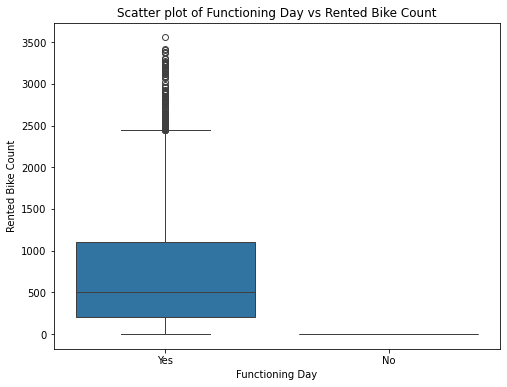

In [8]:
# Compare Rented Bike Count vs Functioning Days by plot a scatter plot
plt.figure(figsize=(8, 6))
sns.boxplot(x='Functioning Day', y='Rented Bike Count', data=X_train_eda)
plt.xlabel('Functioning Day')
plt.ylabel('Rented Bike Count')
plt.title('Scatter plot of Functioning Day vs Rented Bike Count')
plt.show()

In [9]:
X_train_eda[X_train_eda['Functioning Day'] == 'No']['Rented Bike Count'].value_counts().sort_index()

0    223
Name: Rented Bike Count, dtype: int64

In [10]:
# Check which dates have Functioning Day = No
X_train_eda[X_train_eda['Functioning Day'] == 'No']['Date'].value_counts().sort_index()

2018-04-11    24
2018-05-10    24
2018-09-18    24
2018-09-19    24
2018-09-28    24
2018-09-30    24
2018-10-02    24
2018-10-04    24
2018-10-06     7
2018-10-09    24
Name: Date, dtype: int64

### Analysis on features & target variable

For the features:
1. From the EDA, the features do not necessarily have normal distributions, such as bimodal distribution (temperature) and right-skewed distribution (wind speed), etc. 
2. There is heteroskedasticity between the dependent variable (rented bike count) with other independent variables such as temperature. 
3. There are also multicollinearity between the independent and dependent variables:
    - Rented Bike Count is highly correlated with Temperature
    - Dew Point Temperature is highly correlated with Humidity, Seasons & Temperature
    - Temperature is highly correlated with Seasons
4. From EDA, it seems the Rented Bike Count has 2 peaks at around 0600-0800, and around 1700-1900.

In below, the target is investigated.

In [11]:
# Create DateTIme & Day of Week variable 
X_train_eda['Datetime'] = pd.to_datetime(X_train_eda['Date'].dt.strftime('%d/%m/%Y') + ' ' + X_train_eda['Hour'].astype(str), format='%d/%m/%Y %H')
X_train_eda['Day Of Week'] = X_train_eda['Date'].dt.day_name()
X_train_eda.sample(5)

,Date,Rented Bike Count,Hour,Temperature,Humidity,Wind Speed,Visibility,Dew Point Temperature,Solar Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning Day,Datetime,Day Of Week
3711,2018-05-04,1323,15,19.9,26,3.8,1898,-0.1,3.00,0.0,0.0,Spring,No Holiday,Yes,2018-05-04 15:00:00,Friday
4646,2018-06-12,1246,14,25.6,45,2.2,1961,12.7,1.39,0.0,0.0,Summer,No Holiday,Yes,2018-06-12 14:00:00,Tuesday
262,2017-12-11,222,22,-10.2,50,3.0,2000,-18.6,0.00,0.0,0.0,Winter,No Holiday,Yes,2017-12-11 22:00:00,Monday
2154,2018-02-28,11,18,3.6,90,2.1,845,2.1,0.00,9.5,0.0,Winter,No Holiday,Yes,2018-02-28 18:00:00,Wednesday
2136,2018-02-28,266,0,5.1,52,1.1,614,-3.9,0.00,0.0,0.0,Winter,No Holiday,Yes,2018-02-28 00:00:00,Wednesday


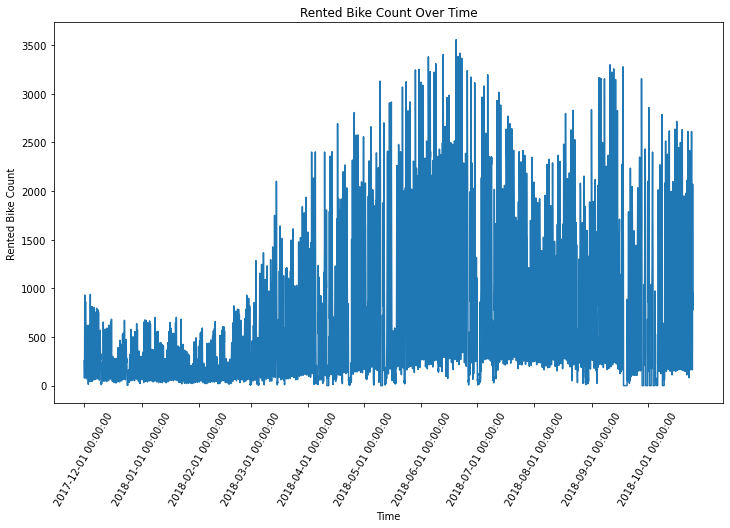

In [12]:
# Check rented bike count (y) over time
fig = plt.figure(figsize=(12,7))
plt.plot(X_train_eda['Rented Bike Count'])
plt.title('Rented Bike Count Over Time')

# Extract the first date of every month at 00:00:00 for x ticks
dates = ['2017-12-01 00:00:00']
for month in range(1,12):
    dates.append(f'2018-{month:02}-01 00:00:00')
x_ticks = X_train_eda[X_train_eda['Datetime'].isin([pd.to_datetime(date) for date in dates])].index
x_ticklabels = dates[:len(x_ticks)]
plt.xticks(ticks=x_ticks, labels=x_ticklabels, rotation=60)

plt.xlabel('Time')
plt.ylabel('Rented Bike Count')
#plt.savefig('./plot/y_line.png', facecolor='w', bbox_inches='tight')
plt.show()

['2018-07-16 00:00 \n(Monday)', '2018-07-17 00:00 \n(Tuesday)', '2018-07-18 00:00 \n(Wednesday)', '2018-07-19 00:00 \n(Thursday)', '2018-07-20 00:00 \n(Friday)', '2018-07-21 00:00 \n(Saturday)', '2018-07-22 00:00 \n(Sunday)']


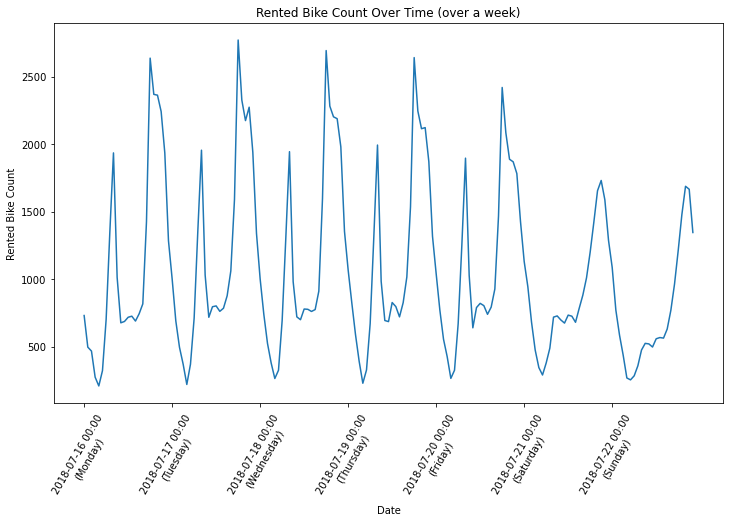

In [40]:
# Zoom in to check rented bike count in a single week

from datetime import timedelta

# Randomly sample a week to find any potential patterns
monday_zero_hour_rows = X_train_eda[(X_train_eda['Hour'] == 0) & (X_train_eda['Day Of Week'] == 'Monday')]
first_idx = np.random.choice(monday_zero_hour_rows.index)
week_later = X_train_eda.iloc[first_idx]['Date'] + timedelta(weeks=1)
last_index = X_train_eda[(X_train_eda['Date'] == week_later) & (X_train_eda['Hour'] == 0)].index[0] - 1
x_label_df = X_train_eda[X_train_eda['Hour'] == 0].loc[first_idx:last_index]
x_ticks = x_label_df.index
x_ticklabels = [f"{row['Date'].strftime('%Y-%m-%d')} 00:00 \n({row['Day Of Week']})" for _, row in x_label_df.iterrows()]
print(x_ticklabels)

fig = plt.figure(figsize=(12,7))
plt.plot(X_train_eda['Rented Bike Count'][first_idx:last_index])
plt.title('Rented Bike Count Over Time (over a week)')
plt.xticks(ticks=x_ticks, labels=x_ticklabels, rotation=60)
plt.xlabel('Date')
plt.ylabel('Rented Bike Count')
plt.show()

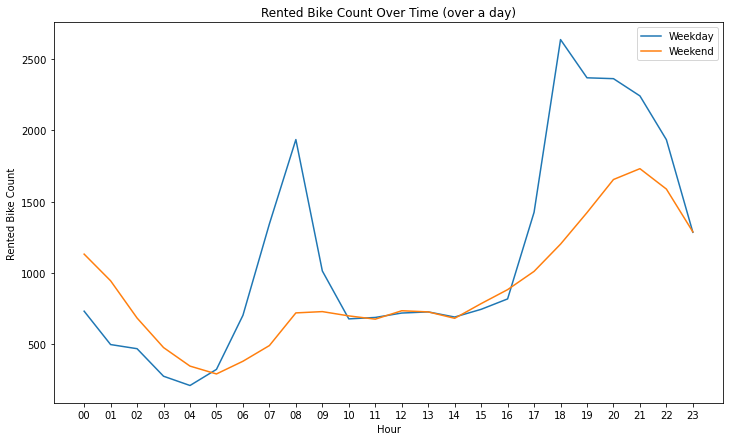

In [41]:
# Further zoom in to check rented bike count in a weekday & weekend
fig = plt.figure(figsize=(12,7))
weekday_plot_df = X_train_eda.loc[first_idx:first_idx+23]
weekday_x = np.array(weekday_plot_df['Hour'])
weekday_y = np.array(weekday_plot_df['Rented Bike Count'])
plt.plot(weekday_x, weekday_y, label='Weekday')

weekend_plot_df = X_train_eda.loc[first_idx+24*5:first_idx+24*5+23]
weekend_x = np.array(weekend_plot_df['Hour'])
weekend_y = np.array(weekend_plot_df['Rented Bike Count'])
plt.plot(weekend_x, weekend_y, label='Weekend')

plt.xticks(ticks=weekday_x, labels=[f'{hour:02}' for hour in weekday_x])
plt.xlabel('Hour')
plt.ylabel('Rented Bike Count')
plt.title('Rented Bike Count Over Time (over a day)')
plt.legend()
plt.show()


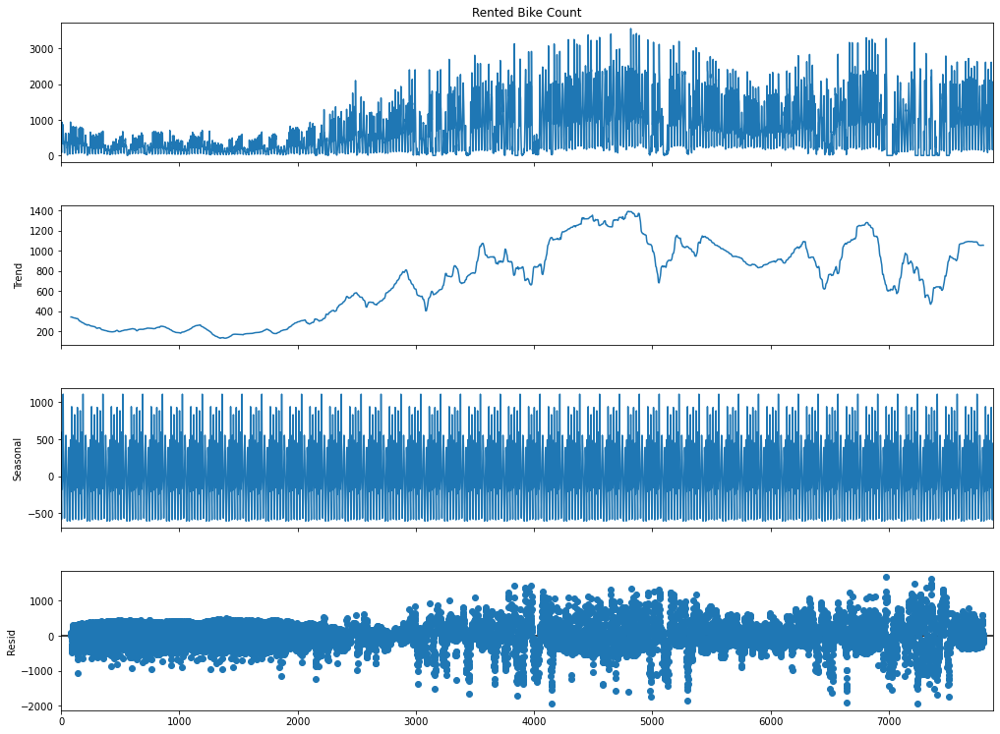

In [15]:
# Check seasonal decompose
from statsmodels.tsa.seasonal import seasonal_decompose

decompose = seasonal_decompose(y_train, model='additive', period=24*7)
fig = decompose.plot()
fig.set_size_inches((16, 12))
plt.show()

For the dependent variable (Rented Bike Count), there is an overall uptrend on rented bike count from December 2017 to June 2018, followed by a small decline until August 2018. It peaked again on September, then followed by another drop until the end of November 2018. 

If we zoon in to view the rented bike count within a single week, a general view is that there are common patterns for weekdays where there are 2 peaks, while for weekends the pattern is different. This may be useful during feature engineering. Note that there may be differences between each week (for example there are holidays in some weekdays).

Further zooming to view the count within a single day, the line for a weekday and a weekend is different. Similar to the previous observations, there are 2 periods where there are higher bike counts for weekdays (0700-0800, 1800-2100).

## Feature Engineering & Data Transformation
Features are engineered before creating train and test sets to train machine learning models for prediction. 

First, as observed in EDA, there may be feature engineering regarding the functioning day and weekday/weekend. 

Second, due to the time series nature, some additional variables are created and experimented, such as hourly lag variable (previous 1 hour), hourly moving average (average of previous 3 hours), and a daily lag variable (previous 24th hour, i.e. bike count at the same hour on previous day).

Third, the numerical variables are standardized using Robust Scaling and the categorical variables are encoded.

In [16]:
from sklearn.preprocessing import RobustScaler, OneHotEncoder
from datetime import timedelta

# Function to feature engineer the train data
def feat_eng(X_train, robust_scaler=None, onehot_encoder=None):
    # Remove non-functioning days & the functioning day column
    X_temp = X_train[X_train['Functioning Day'] != 'No'].drop(columns=['Functioning Day']).reset_index(drop=True)

    # Create a new variable 'weekday' to indicate if the day is weekday(1) or weekend (0)
    X_temp['Weekday'] = X_temp['Date'].dt.day_name()
    X_temp['Weekday'] = X_temp['Weekday'].map(lambda x: 0 if x in ['Saturday', 'Sunday'] else 1)

    # Creating lag variables and moving averages
    X_temp['Hourly_Lag'] = X_temp['Rented Bike Count'].shift(periods=1)
    X_temp['Hourly_Moving_Average'] = X_temp['Rented Bike Count'].shift(1).rolling(window=3, center=False).mean()
    X_temp['Daily_Lag'] = X_temp['Rented Bike Count'].shift(periods=24)
    X_temp = X_temp.dropna().reset_index(drop=True)

    # Obtain the targets after dropping first rows without previous observations
    y_new = X_temp['Rented Bike Count']
    date_range = X_temp.apply(lambda x: x['Date'] + timedelta(hours=x['Hour']), axis=1)

    # Separate numerical and categorical variables for handling
    num_X_cols = ['Hour', 'Temperature', 'Humidity',
                    'Wind Speed', 'Visibility', 'Dew Point Temperature', 'Solar Radiation',
                    'Rainfall', 'Snowfall', 'Hourly_Lag', 'Hourly_Moving_Average', 'Daily_Lag']
    cat_X_cols = ['Seasons', 'Holiday', 'Weekday']
    num_X = X_temp[num_X_cols]
    cat_X = X_temp[cat_X_cols]
    
    # Robust scaling for numerical features
    # If a trained scaler is passed (fitted with X_train), use it instead
    # Otherwise, train a new scaler
    if robust_scaler is None:
        robust_scaler = RobustScaler().fit(num_X)
    scaled_num_X = robust_scaler.transform(num_X)
    scaled_num_X = pd.DataFrame(scaled_num_X, columns=num_X.columns)
    
    # Use one-hot encoding for Seasons (classes > 2), binary encoding for Holiday (classes = 2)
    if onehot_encoder is None:
        onehot_encoder = OneHotEncoder().fit(cat_X[['Seasons']])
    season_X = onehot_encoder.transform(cat_X[['Seasons']]).toarray()
    season_X = pd.DataFrame(season_X, columns=onehot_encoder.get_feature_names_out(['Seasons']))

    binary_X = cat_X.drop(columns='Seasons') 
    binary_X['Holiday'] = binary_X['Holiday'].map({'No Holiday': 0, 'Holiday': 1})

    # Concatenate scaled numerical and encoded categorical features into a single DataFrame
    X_new = pd.concat([scaled_num_X, season_X, binary_X], axis=1)

    return X_new, y_new, date_range, robust_scaler, onehot_encoder

In [17]:
# Get the feature engineered X and y
X_train, y_train, train_daterange, robust_scaler, onehot_encoder = feat_eng(X_train)
X_test, y_test, test_daterange, _, _ = feat_eng(X_test, robust_scaler=robust_scaler, onehot_encoder=onehot_encoder)

print('Shapes of X_train, y_train, X_test, y_test: ', X_train.shape, y_train.shape, X_test.shape, y_test.shape)
print(f'There are {X_train.shape[1]} predictors: {list(X_train.columns)}')
print(f'Train set ranges from {train_daterange.iloc[0]} - {train_daterange.iloc[-1]}')
print(f'Test set ranges from {test_daterange.iloc[0]} - {test_daterange.iloc[-1]}')

Shapes of X_train, y_train, X_test, y_test:  (7637, 18) (7637,) (780, 18) (780,)
There are 18 predictors: ['Hour', 'Temperature', 'Humidity', 'Wind Speed', 'Visibility', 'Dew Point Temperature', 'Solar Radiation', 'Rainfall', 'Snowfall', 'Hourly_Lag', 'Hourly_Moving_Average', 'Daily_Lag', 'Seasons_Autumn', 'Seasons_Spring', 'Seasons_Summer', 'Seasons_Winter', 'Holiday', 'Weekday']
Train set ranges from 2017-12-02 00:00:00 - 2018-10-25 11:00:00
Test set ranges from 2018-10-26 12:00:00 - 2018-11-30 23:00:00


## Model training

To serve as a baseline, we will first run a basic linear regression. Then, different models will be experimented and see if the results can be improved. The model performance evaluated will be evaluated with RMSE and R square.

In [18]:
from statsmodels.tools.eval_measures import rmse
from sklearn.metrics import r2_score

# Function to plot regression plots
def plot_graphs(y_test, y_pred, test_daterange, model_name):
    # Plot true y VS predicted y
    fig = plt.figure(figsize=(24,12))
    ax1 = fig.add_subplot(2,3,1)
    ax1.scatter(y_test, y_pred, color='blue', alpha=0.5)
    ax1.plot(range(max(y_test)), range(max(y_test)), color='black')
    ax1.set_xlabel('Actual Rented Bike Count')
    ax1.set_ylabel('Predicted Rented Bike Count')
    ax1.set_title(f'Actual vs Predicted Rented Bike Count\n({model_name})')

    # Plot true y VS residual
    res = y_test - y_pred

    ax2 = fig.add_subplot(2,3,2)
    ax2.axhline(y=0, color='black', linestyle='--')
    ax2.scatter(y_pred, res, color='blue', alpha=0.5)
    ax2.set_xlabel('Predicted Rented Bike Count')
    ax2.set_ylabel('Residual')
    ax2.set_title(f'Predicted Rented Bike Count vs Residual\n({model_name})')

    # Plot histogram of predicted y
    ax3 = fig.add_subplot(2,3,3)
    ax3.hist(y_pred, bins=50)
    ax3.set_title('Histogram of Predicted Bike Count')

    # Plot histogram of residuals
    ax4 = fig.add_subplot(2,3,4)
    ax4.hist(res)
    ax4.set_title('Histogram of Predicted Rented Bike Residual')

    plt.show()

    # Plot true y vs predicted y over time
    fig = plt.figure(figsize=(20,10))
    ax5 = fig.add_subplot(1,1,1)
    ax5.plot(y_test, color='red', label='actual')
    ax5.plot(y_pred, color='blue', label='predicted', alpha=0.5)
    ax5.set_xlabel('Time')
    ax5.set_ylabel('Rented Bike Count')
    ax5.set_title(f'Actual vs Predicted Rented Bike Count Over Time\n({model_name})')
    x_ticks = list(range(0, len(y_pred), 200))
    ax5.set_xticks(x_ticks)
    ax5.set_xticklabels(test_daterange[x_ticks], rotation=45)
    ax5.legend()
    plt.show()

# Function to evaluate models
def eval(y_test, y_pred, test_daterange, model_name):
    res_rmse = rmse(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f'Test RMSE: {res_rmse}')
    print(f'R2: {r2}')

    # Plot result graphs
    plot_graphs(y_test, y_pred, test_daterange, model_name)

    return res_rmse, r2

### Linear Regression

In [19]:
import statsmodels.api as sm

# Function to run linear regression
def sm_ols(X_train, X_test, y_train, y_test, model_name):
    # Fit the model
    ols_model = sm.OLS(y_train, X_train)
    ols_result = ols_model.fit()
    print(ols_result.summary())

    # Inference on test set
    y_pred = ols_result.predict(X_test)
    res_rmse, r2 = eval(y_test, y_pred, test_daterange, model_name)

    return res_rmse, r2


                            OLS Regression Results                            
Dep. Variable:      Rented Bike Count   R-squared:                       0.555
Model:                            OLS   Adj. R-squared:                  0.554
Method:                 Least Squares   F-statistic:                     679.4
Date:                Tue, 27 Aug 2024   Prob (F-statistic):               0.00
Time:                        00:09:17   Log-Likelihood:                -57309.
No. Observations:                7637   AIC:                         1.146e+05
Df Residuals:                    7622   BIC:                         1.148e+05
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                  1.564e+

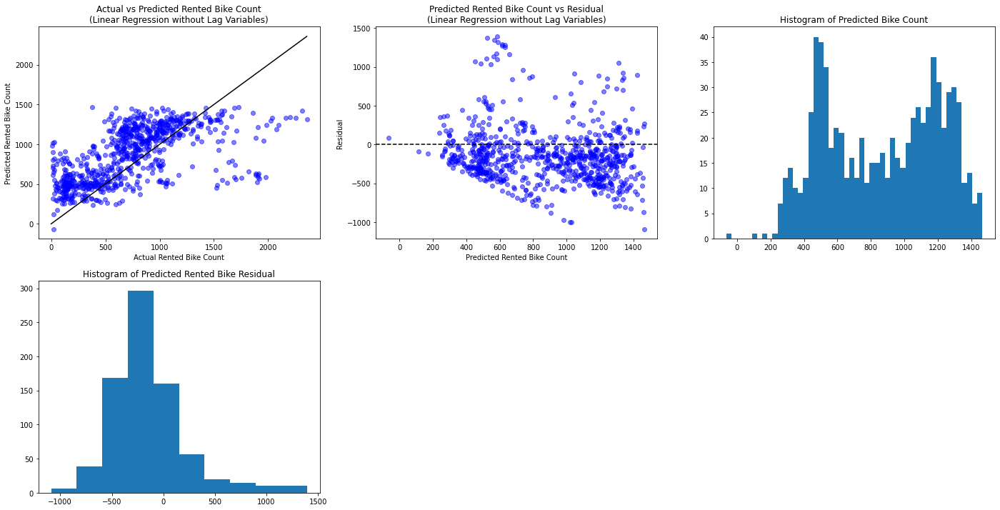

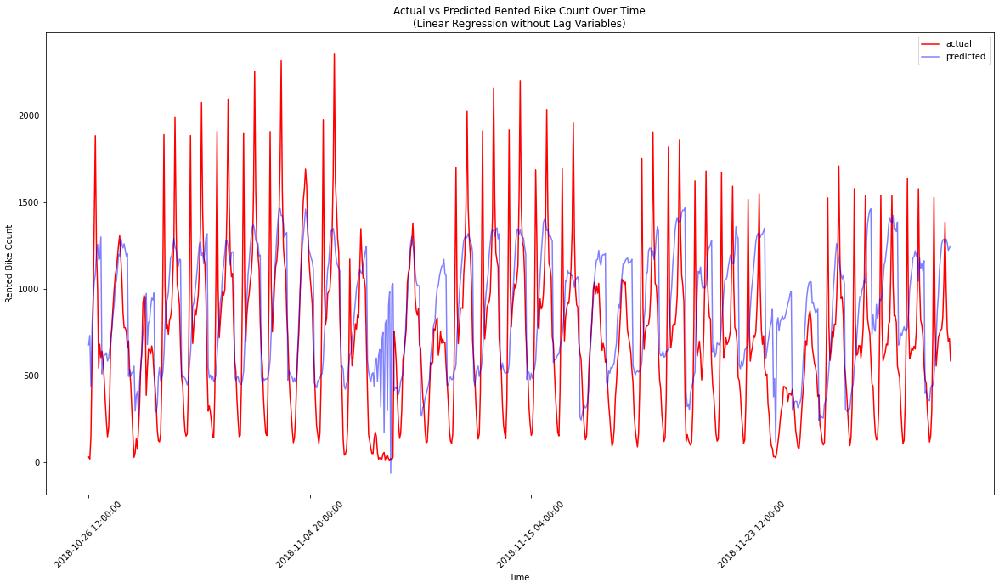

In [20]:
# Linear Regression without lag variables
model_name = 'Linear Regression without Lag Variables'
X_train_const = sm.add_constant(X_train.drop(columns=['Hourly_Lag', 'Hourly_Moving_Average', 'Daily_Lag']))
X_test_const = sm.add_constant(X_test.drop(columns=['Hourly_Lag', 'Hourly_Moving_Average', 'Daily_Lag']), has_constant='add')
ols_wout_lag_rmse, ols_wout_lag_r2 = sm_ols(X_train_const, X_test_const, y_train, y_test, model_name)

                            OLS Regression Results                            
Dep. Variable:      Rented Bike Count   R-squared:                       0.871
Model:                            OLS   Adj. R-squared:                  0.870
Method:                 Least Squares   F-statistic:                     3014.
Date:                Tue, 27 Aug 2024   Prob (F-statistic):               0.00
Time:                        00:09:18   Log-Likelihood:                -52595.
No. Observations:                7637   AIC:                         1.052e+05
Df Residuals:                    7619   BIC:                         1.054e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                  3.083e+

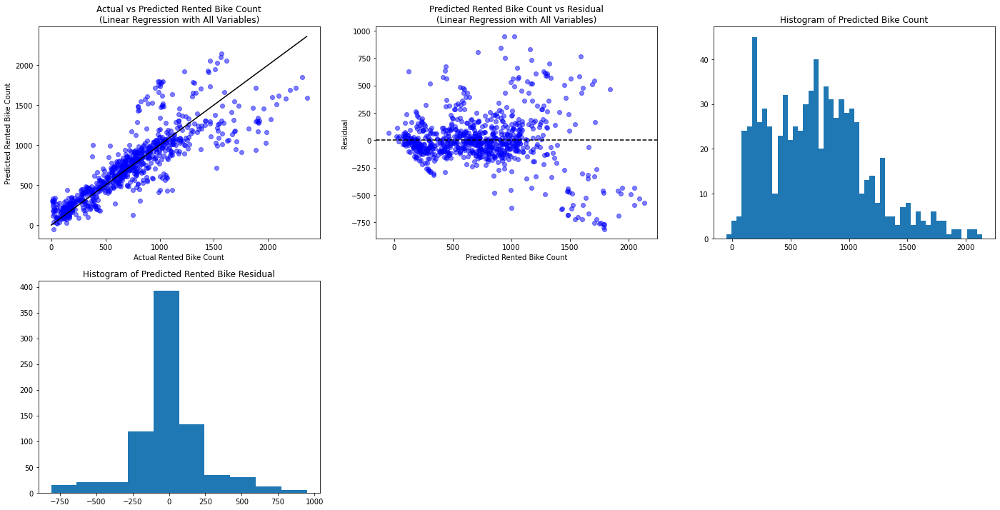

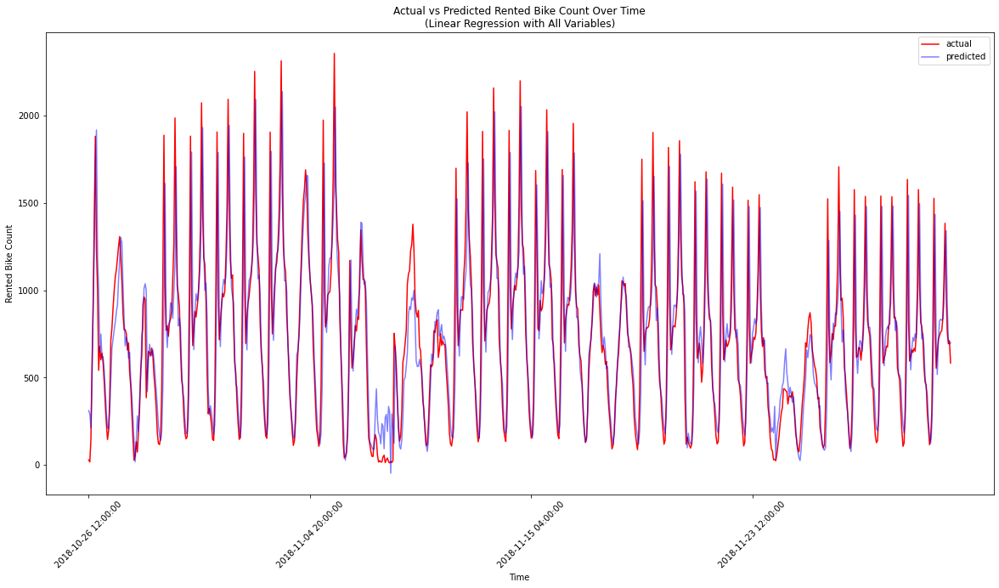

In [21]:
# Linear Regression with Lag Variables
model_name = 'Linear Regression with All Variables'
X_train_const = sm.add_constant(X_train)
X_test_const = sm.add_constant(X_test, has_constant='add')
ols_all_rmse, ols_all_r2 = sm_ols(X_train_const, X_test_const, y_train, y_test, model_name)

                            OLS Regression Results                            
Dep. Variable:      Rented Bike Count   R-squared:                       0.868
Model:                            OLS   Adj. R-squared:                  0.868
Method:                 Least Squares   F-statistic:                     5596.
Date:                Tue, 27 Aug 2024   Prob (F-statistic):               0.00
Time:                        00:24:02   Log-Likelihood:                -52656.
No. Observations:                7637   AIC:                         1.053e+05
Df Residuals:                    7627   BIC:                         1.054e+05
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                   485.03

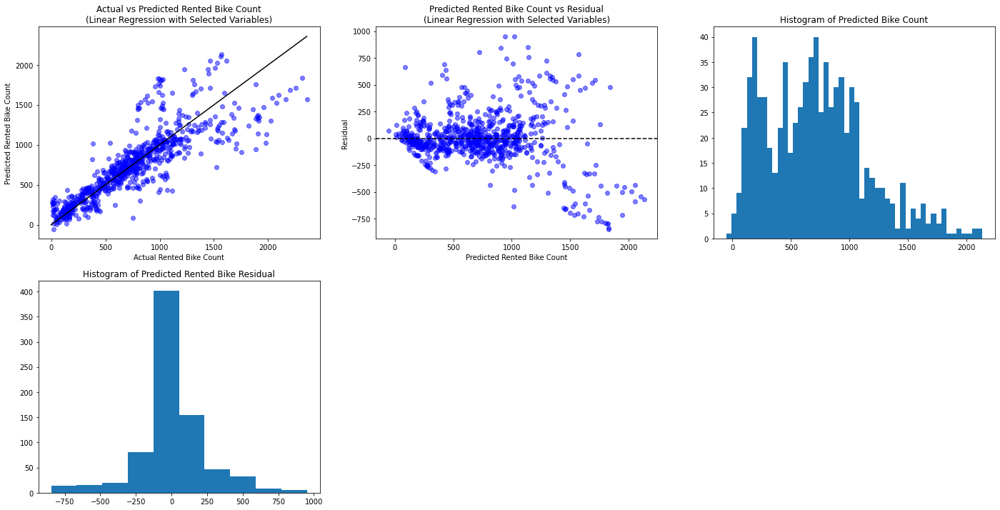

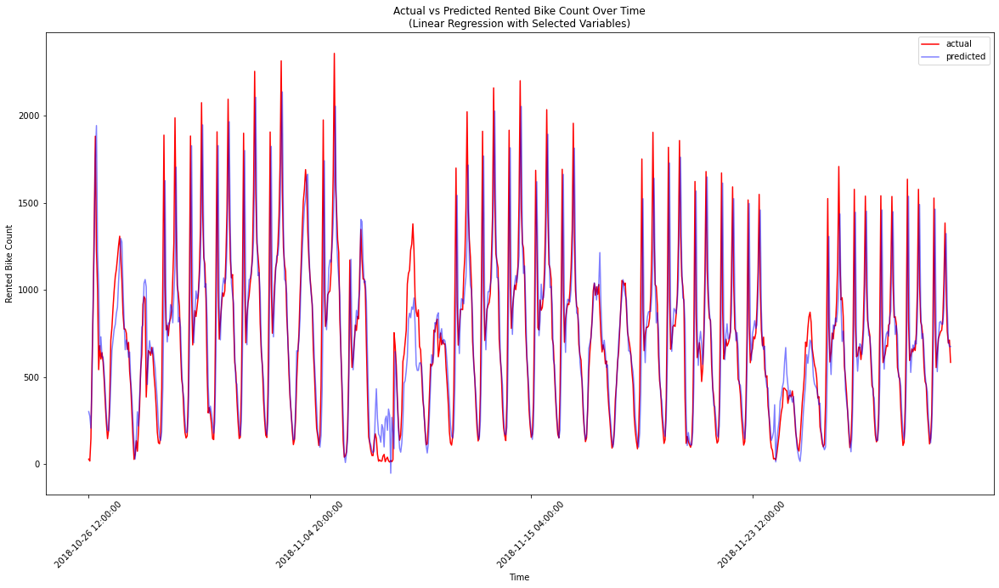

In [37]:
# Linear Regression with Selected Variables
selected_X = ['Humidity', 'Visibility', 'Solar Radiation', 'Rainfall', 'Hourly_Lag', 
              'Hourly_Moving_Average', 'Daily_Lag', 'Holiday', 'Weekday']
model_name = 'Linear Regression with Selected Variables'
X_train_const = sm.add_constant(X_train[selected_X])
X_test_const = sm.add_constant(X_test[selected_X], has_constant='add')
ols_sel_rmse, ols_sel_r2 = sm_ols(X_train_const, X_test_const, y_train, y_test, model_name)

First, linear regression with and without lag variables have been tested just to investigate the difference. Without the lag variables, the Test RMSE is ~391 and the R2 score is ~0.27, which indicates the model is not very accurate. The plot of Predicted Y VS Residual shows the heteroskedasticity, which explains the poor performance. The Durbin-Watson score is ~0.51, which indicates a positive autocorrelation in the responses.

However, after adding back the lag variables, the performance of linear regression significantly increases. The RMSE has reduced ~39% to 237, and R2 has increased ~170% to 0.73. This is because lag variables help cature the autocorrelation, which improve the model's ability in forecasting future values.

After that, based on the P>|t| and alpha = 0.05, features with p-value < 0.05 are extracted to fit in a linear regression model once again. The results are similar to the one with all features, with a slightly higher RMSE of ~240.

### Random Forest

Due to the temporal nature, normal cross validation is undesirable. Therefore, TimeSeriesSplit cross-validation is used for applicable ML models, preserving the temporal order.

In [23]:
from sklearn.model_selection import TimeSeriesSplit, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score

# Set up a 5-fold time series split CV
tscv = TimeSeriesSplit(n_splits=5)

In [24]:
# Define hyperparameter search spaces
param_grid_rf = {
    'n_estimators': [100, 150, 200],
    'max_depth': [10, 15, 20],
    'min_samples_split': [2, 5, 10]
}

# Random Forest Hyperparameter Tuning
rf_model = RandomForestRegressor(random_state=21)
rf_grid_search = GridSearchCV(rf_model, param_grid_rf, cv=tscv, scoring='neg_mean_squared_error')
rf_grid_search.fit(X_train, y_train)
print(f'Best Random Forest Parameters: {rf_grid_search.best_params_}')
print(f'Best Random Forest RMSE: {np.sqrt(-rf_grid_search.best_score_)}')

Best Random Forest Parameters: {'max_depth': 20, 'min_samples_split': 2, 'n_estimators': 150}
Best Random Forest RMSE: 221.36465091605083


Test RMSE: 141.33372070583582
R2: 0.9045846230416155


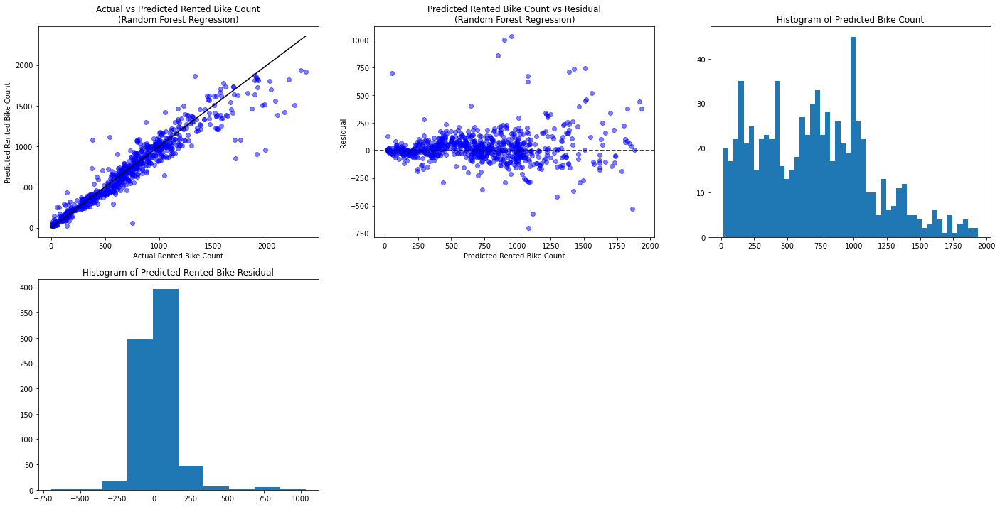

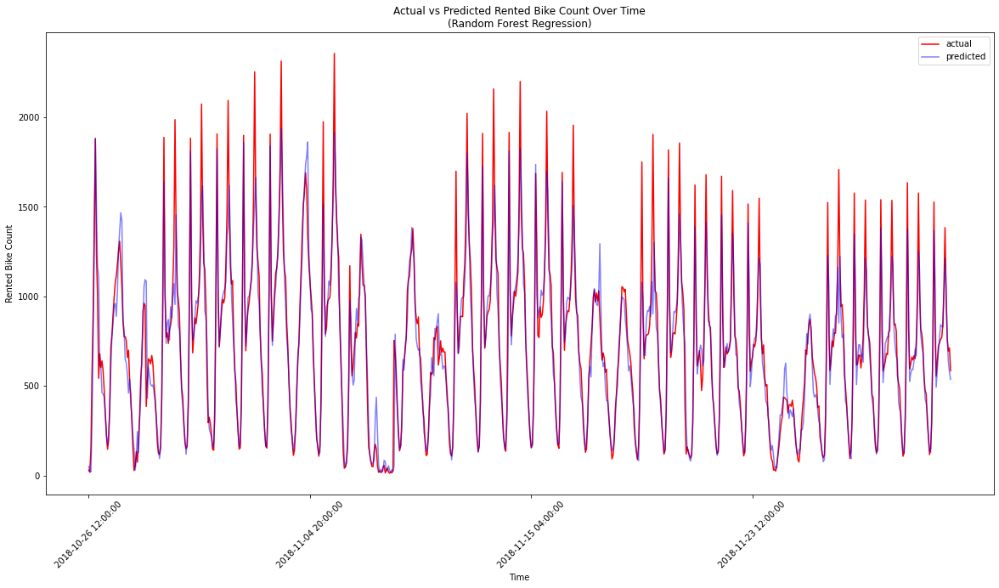

In [25]:
# Fit the whole train set into the Random Forest Regressor & test on test set
model_name = 'Random Forest Regression'
rf_model = RandomForestRegressor(**rf_grid_search.best_params_, random_state=21)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
rf_rmse, rf_r2 = eval(y_test, y_pred, test_daterange, model_name)

                  Feature  Importance
0              Hourly_Lag    0.807096
1               Daily_Lag    0.088884
2                    Hour    0.041934
3         Solar Radiation    0.020805
4   Hourly_Moving_Average    0.016415
5             Temperature    0.007452
6   Dew Point Temperature    0.003470
7                Humidity    0.003392
8                 Weekday    0.003217
9              Wind Speed    0.002307
10             Visibility    0.001996
11               Rainfall    0.001246
12         Seasons_Spring    0.000684
13         Seasons_Autumn    0.000344
14         Seasons_Summer    0.000327
15                Holiday    0.000265
16         Seasons_Winter    0.000149
17               Snowfall    0.000018


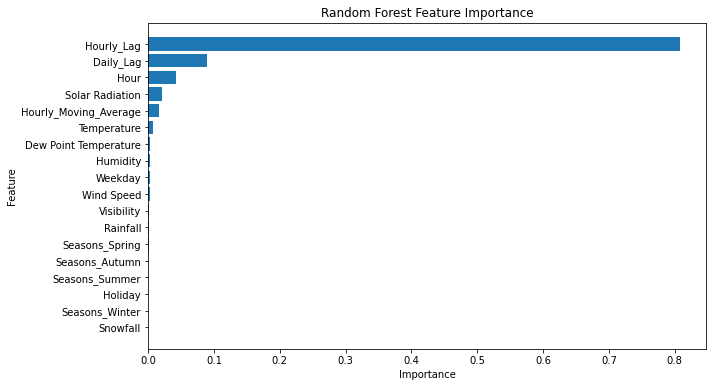

In [26]:
# Get feature importances
importances = rf_model.feature_importances_
feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False).reset_index(drop=True)
print(feature_importance_df)

# Visualize feature importance
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'][::-1], feature_importance_df['Importance'][::-1])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Random Forest Feature Importance')
plt.show()

Random Forest performed better than Linear Regression with a lower RMSE of ~141 and a higher R2 ~0.90. More residuals have roughly similar variance, even though there are still some outliers where the actual bike count is noticably higher than the predicted bike count. Random Forest is expected to have better performance than Linear Regression because:
- Random Forest can capture non-linear relationships while Linear Regression cannot
- Decision Trees can capture interactions between features but not for Linear Regression
- Random Forest is more robust to outliers
- Random Forest helps mitigate impact of multicollinearity by randomly select features for each tree

The Hourly_Lag (last hour) variable has the highest importance among other variables, followed by Daily_Lag (prev. day same hour). There are also other important variables such as hour and solar radiation.

### XGBoost

In [27]:
import xgboost as xgb

# Create an XGBoost model
xgb_model = xgb.XGBRegressor()

# Define the parameter grid for tuning
param_grid_xgb = {
    'learning_rate': [0.1, 0.15, 0.2],
    'max_depth': [3, 5, 7],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.7, 0.8, 0.9],
    'colsample_bytree': [0.7, 0.8, 0.9],
}

# Perform grid search with cross-validation on the training set
xgb_grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid_xgb, scoring='neg_mean_squared_error', cv=tscv)
xgb_grid_search.fit(X_train, y_train)

# Get the best model from grid search
print(f'Best XGBoost Parameters: {xgb_grid_search.best_params_}')
print(f'Best XGBoost RMSE: {np.sqrt(-xgb_grid_search.best_score_)}')

Best XGBoost Parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.2, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.9}
Best XGBoost RMSE: 199.23990592461135


Test RMSE: 146.05808980104155
R2: 0.8980990648269653


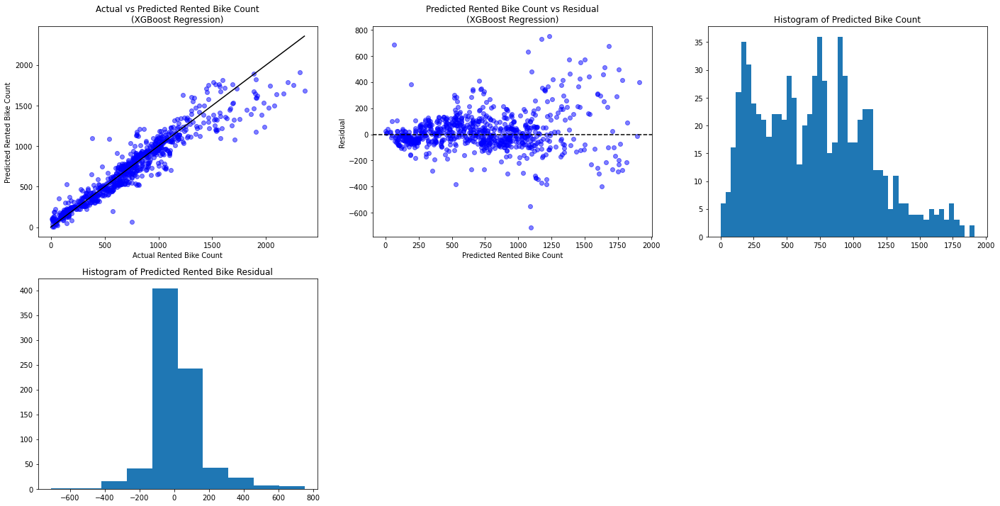

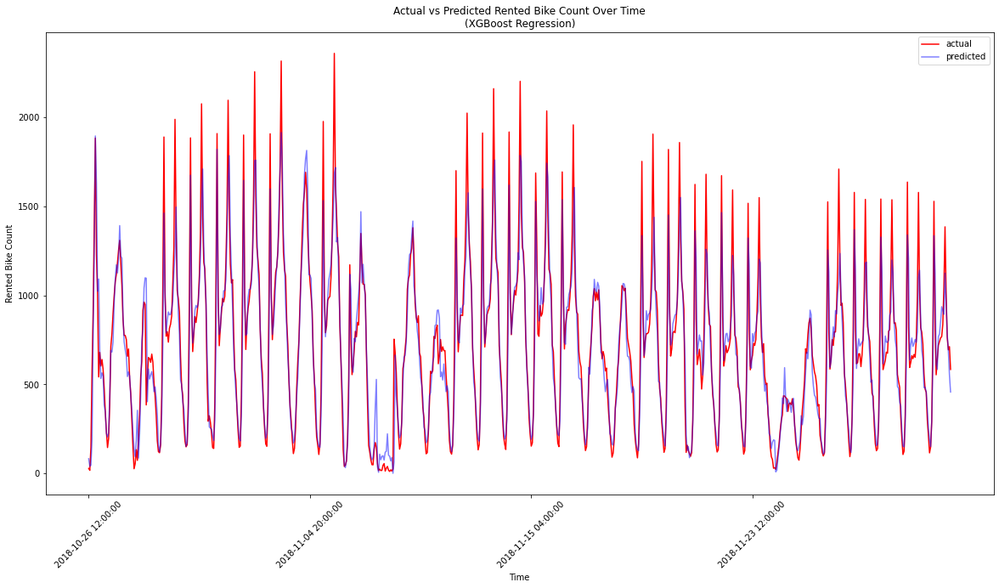

In [28]:
# Fit the whole train set into the XGBoost Regressor & test on test set
model_name = 'XGBoost Regression'
xgb_model = xgb.XGBRegressor(**xgb_grid_search.best_params_, random_state=21)
xgb_model.fit(X_train, y_train)
y_pred = xgb_model.predict(X_test)
xgb_rmse, xgb_r2 = eval(y_test, y_pred, test_daterange, model_name)

XGBoost achieves a high performance with a RMSE of ~146 and R2 of ~0.898, which is slightly worse than Random Forest. The down side of this model is that XGBoost is less interpretable. We can try to use other approaches like SHAP to explain the model.

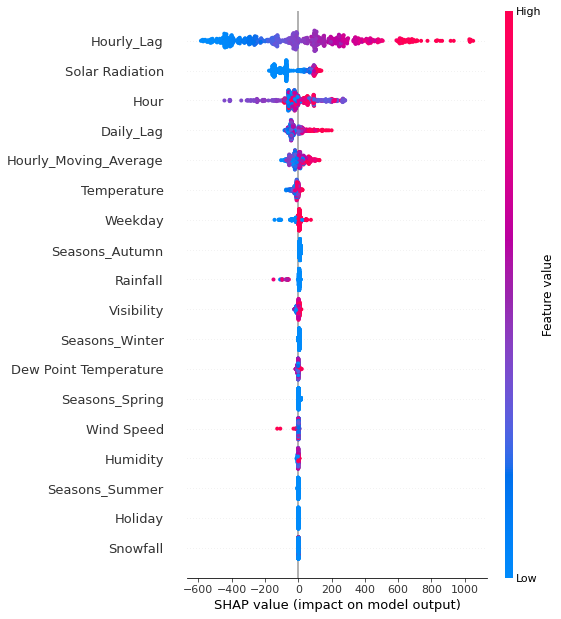

In [29]:
import shap

# Beeswarm plot
explainer = shap.TreeExplainer(xgb_model)
shap_values = explainer.shap_values(X_test)
shap.summary_plot(shap_values, X_test) 

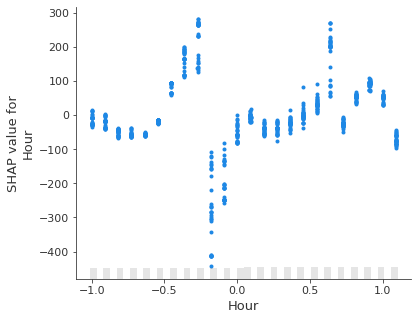

In [30]:
# Scatter plot to check the effect of a single feature
shap.plots.scatter(explainer(X_test)[:, 'Hour'])

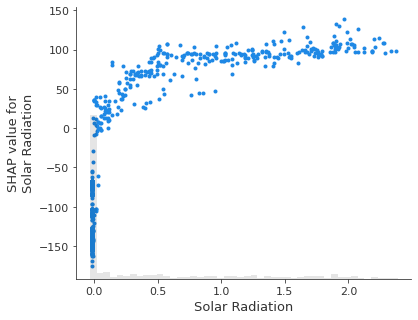

In [31]:
shap.plots.scatter(explainer(X_test)[:, 'Solar Radiation'])

In [32]:
# Force Plot to show how features influence the final predicted outcome
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values[1,:], X_test.iloc[1,:]) 

In [33]:
shap.plots.force(explainer.expected_value, shap_values[:500], X_test.iloc[:500])

It seems Hourly_Lag, Hour and Solar Radiation are the top 3 features which contributed to the prediction. However, sometimes other predictors also have a noticable influence in the final prediction, such as in the force plot, rainfall is one of the noticable predictors to push the prediction to a lower value. 

The prediction of Hour is close to the interaction graph between Hour and Rented Bike Count in the EDA phase, and for Solar Radiation, higher solar radiation tends to have a higher rented bike count.

### Prophet

In [34]:
# Prepare train & test data in specific format for Prophet format
def prep_prophet_data(X, daterange, y=None):
    X_prophet = X.copy()
    X_prophet = X_prophet.drop(columns=['Hourly_Lag', 'Hourly_Moving_Average', 'Daily_Lag', 'Hour'])
    X_prophet['ds'] = daterange
    if y is not None:
        X_prophet['y'] = y
    return X_prophet

X_train_prophet, X_val_prophet, y_train_prophet, y_val_prophet = train_test_split(X_train, y_train, test_size=0.1, shuffle=False)
X_train_prophet = prep_prophet_data(X_train_prophet, train_daterange[:X_train_prophet.shape[0]], y=y_train_prophet)
X_val_prophet = prep_prophet_data(X_val_prophet, train_daterange[X_train_prophet.shape[0]:], y=None)
X_test_prophet = prep_prophet_data(X_test, test_daterange, y=None)
print(f'Shape of train, val & test data: {X_train_prophet.shape}, {X_val_prophet.shape}, {X_test_prophet.shape}')

Shape of train, val & test data: (6873, 16), (764, 15), (780, 15)


In [45]:
from prophet import Prophet
from scipy.stats import uniform
from mango import Tuner

# Define hyperparameters to tune, based on official documentation
param_space = dict(seasonality_mode = ['additive', 'multiplicative'],
                   seasonality_prior_scale=uniform(0.01, 10-0.01),
                   changepoint_prior_scale=uniform(0.001, 0.5-0.001),
                   holidays_prior_scale=uniform(0.01, 10-0.01),
                   changepoint_range=uniform(0.8, 0.95-0.8)
                   )

add_regressors = ['Temperature', 'Humidity', 'Wind Speed', 'Visibility',
       'Dew Point Temperature', 'Solar Radiation', 'Rainfall', 'Snowfall',
       'Seasons_Autumn', 'Seasons_Spring', 'Seasons_Summer', 'Seasons_Winter',
       'Holiday', 'Weekday']

# Define objective function to run hyperparameter tuning
def objective_function(args_list):
    global X_train_prophet, X_test_prophet, y_test, add_regressors
    
    params_evaluated = []
    results = []

    for params in args_list:
        # Train a Prophet model with diff. combinations of params & get rmse error
        model = Prophet(**params)
        for regressor in add_regressors:
            model.add_regressor(regressor)
        model.fit(X_train_prophet)
        forecast = model.predict(X_val_prophet)
        predictions_tuned = forecast.tail(X_val_prophet.shape[0])
        error = rmse(y_val_prophet, predictions_tuned['yhat'])   
        
        params_evaluated.append(params)
        results.append(error)
        
    return params_evaluated, results

In [59]:
# Run 60 iterations to find optimal values of hyperparameters
conf_Dict = dict()
conf_Dict['initial_random'] = 10
conf_Dict['num_iteration'] = 50

tuner = Tuner(param_space, objective_function, conf_Dict)
results = tuner.minimize()
print('best parameters:', results['best_params'])
print('best loss:', results['best_objective'])

00:51:41 - cmdstanpy - INFO - Chain [1] start processing
00:51:46 - cmdstanpy - INFO - Chain [1] done processing
00:51:47 - cmdstanpy - INFO - Chain [1] start processing
00:51:51 - cmdstanpy - INFO - Chain [1] done processing
00:51:51 - cmdstanpy - INFO - Chain [1] start processing
00:51:56 - cmdstanpy - INFO - Chain [1] done processing
00:51:57 - cmdstanpy - INFO - Chain [1] start processing
00:52:00 - cmdstanpy - INFO - Chain [1] done processing
00:52:01 - cmdstanpy - INFO - Chain [1] start processing
00:52:07 - cmdstanpy - INFO - Chain [1] done processing
00:52:08 - cmdstanpy - INFO - Chain [1] start processing
00:52:10 - cmdstanpy - INFO - Chain [1] done processing
00:52:11 - cmdstanpy - INFO - Chain [1] start processing
00:52:13 - cmdstanpy - INFO - Chain [1] done processing
00:52:14 - cmdstanpy - INFO - Chain [1] start processing
00:52:22 - cmdstanpy - INFO - Chain [1] done processing
00:52:23 - cmdstanpy - INFO - Chain [1] start processing
00:52:24 - cmdstanpy - INFO - Chain [1]

best parameters: {'changepoint_prior_scale': 0.49711176530309004, 'changepoint_range': 0.8066204872266989, 'holidays_prior_scale': 0.9863883069466356, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6463965241451513}
best loss: 394.05112113710993


00:58:47 - cmdstanpy - INFO - Chain [1] start processing
00:58:51 - cmdstanpy - INFO - Chain [1] done processing


Test RMSE: 447.39820948778123
R2: 0.0438736890702206


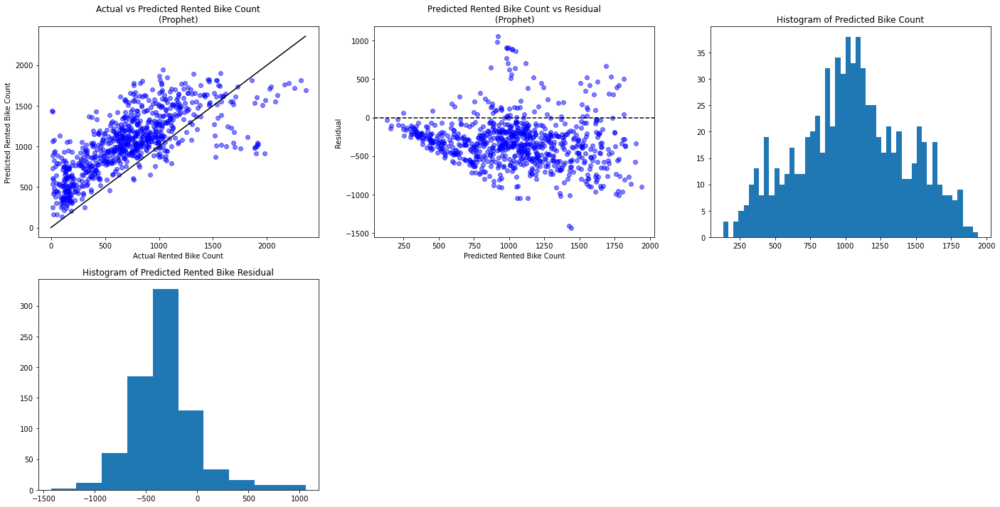

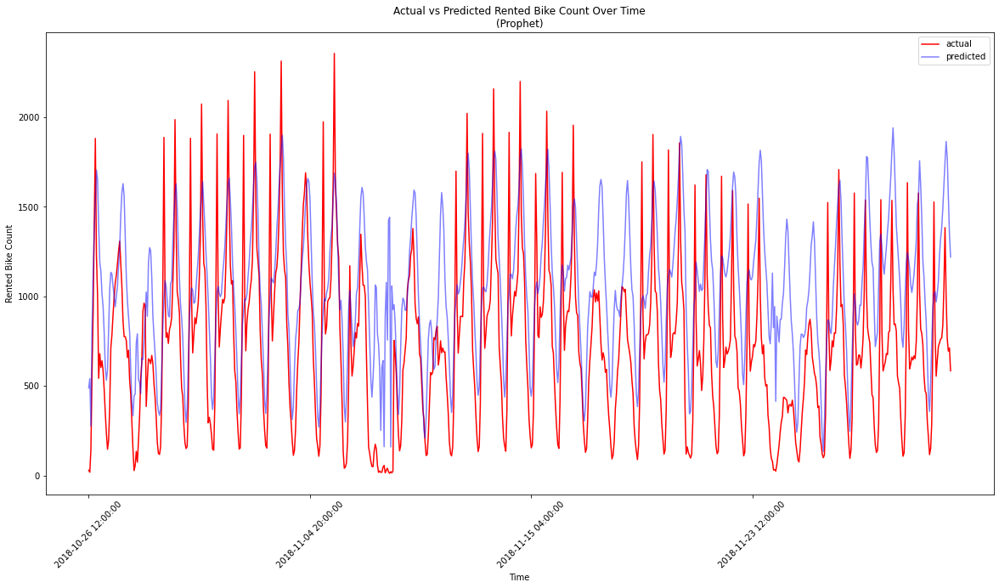

In [60]:
# Fit the model with the best parameter again and get test data results
model = Prophet(**results['best_params'])
for regressor in add_regressors:
    model.add_regressor(regressor)
X_val_prophet['y'] = y_val_prophet    # append y_val to X_val_prophet
model.fit(pd.concat([X_train_prophet, X_val_prophet]))  # increase training data size by also using val dataset 
forecast = model.predict(X_test_prophet)
y_pred = forecast['yhat']

model_name = 'Prophet'
prophet_rmse, prophet_r2 = eval(y_test, y_pred, test_daterange, model_name)

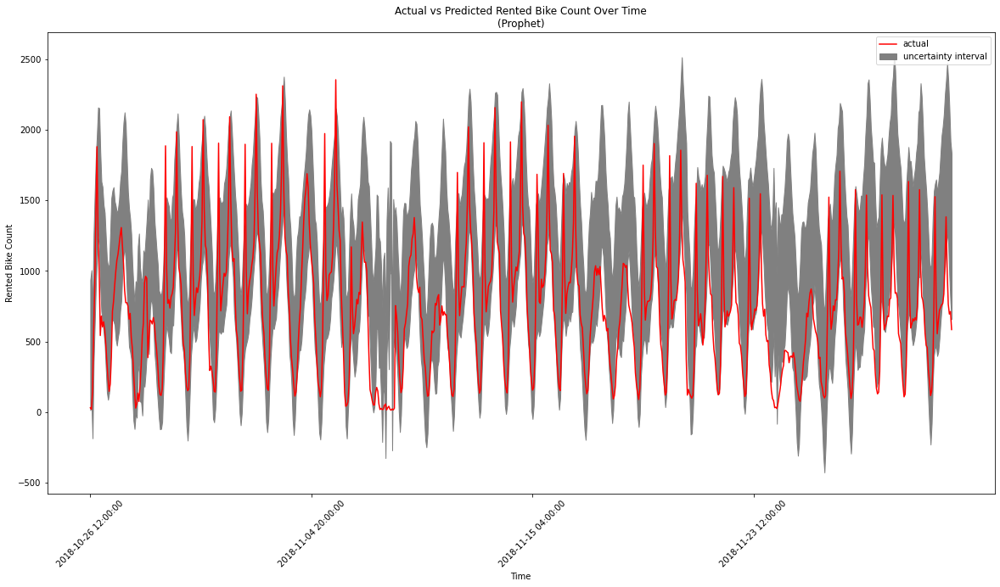

In [61]:
# Plot true y vs predicted y over time again but with uncertainty interval
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(1,1,1)
ax.plot(list(range(0, len(y_pred))), y_test, color='red', label='actual')
ax.fill_between(list(range(0, len(y_pred))), forecast['yhat_lower'], forecast['yhat_upper'], color='grey', label='uncertainty interval')
ax.set_xlabel('Time')
ax.set_ylabel('Rented Bike Count')
ax.set_title(f'Actual vs Predicted Rented Bike Count Over Time\n({model_name})')
x_ticks = list(range(0, len(y_pred), 200))
ax.set_xticks(x_ticks)
ax.set_xticklabels(test_daterange[x_ticks], rotation=45)
ax.legend()
plt.show()


### Conclusion Table
A table was created to summarize the results.

In [62]:
results = {'Linear Regression (Without Lag Variables)':  [ols_wout_lag_rmse, ols_wout_lag_r2],
           'Linear Regression (All features)': [ols_all_rmse, ols_all_r2],
           'Linear Regression (Selected features)': [ols_sel_rmse, ols_sel_r2],
           'Random Forest': [rf_rmse, rf_r2],
           'XGBoost': [xgb_rmse, xgb_r2],
           'Prophet': [prophet_rmse, prophet_r2]
        }

results_df = pd.DataFrame(results, index=['RMSE', 'R Square'])
results_df

,Linear Regression (Without Lag Variables),Linear Regression (All features),Linear Regression (Selected features),Random Forest,XGBoost,Prophet
RMSE,391.350882,237.907301,239.722935,141.333721,146.058090,447.398209
R Square,0.268424,0.729640,0.725498,0.904585,0.898099,0.043874


To conclude, ___ model has the best performance in predicting rented bike count. The top 3 features are ___. 